# 1. Load dataset

1.1. install libraries and libraries

In [19]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [53]:
import warnings
warnings.filterwarnings('ignore')

1.2. Load dataset

In [20]:
import pandas as pd
df = pd.read_csv("/content/drive/MyDrive/datasets/parkinsons.data", sep=',', index_col='name')
df.shape

(195, 23)

In [21]:
df.head()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
name,,,,,,,,,,,,,,,,,,,,,
phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,0.426,...,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,0.626,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,0.482,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,0.517,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,0.584,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


# 2. Data preparation

2.1. Import required libraries

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

2.2. Data cleaning and preparation

In [23]:
df.isnull().sum()

,0
MDVP:Fo(Hz),0
MDVP:Fhi(Hz),0
MDVP:Flo(Hz),0
MDVP:Jitter(%),0
MDVP:Jitter(Abs),0
MDVP:RAP,0
MDVP:PPQ,0
Jitter:DDP,0
MDVP:Shimmer,0
MDVP:Shimmer(dB),0


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 195 entries, phon_R01_S01_1 to phon_R01_S50_6
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   MDVP:Fo(Hz)       195 non-null    float64
 1   MDVP:Fhi(Hz)      195 non-null    float64
 2   MDVP:Flo(Hz)      195 non-null    float64
 3   MDVP:Jitter(%)    195 non-null    float64
 4   MDVP:Jitter(Abs)  195 non-null    float64
 5   MDVP:RAP          195 non-null    float64
 6   MDVP:PPQ          195 non-null    float64
 7   Jitter:DDP        195 non-null    float64
 8   MDVP:Shimmer      195 non-null    float64
 9   MDVP:Shimmer(dB)  195 non-null    float64
 10  Shimmer:APQ3      195 non-null    float64
 11  Shimmer:APQ5      195 non-null    float64
 12  MDVP:APQ          195 non-null    float64
 13  Shimmer:DDA       195 non-null    float64
 14  NHR               195 non-null    float64
 15  HNR               195 non-null    float64
 16  status            195 non

In [25]:
df.describe()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
count,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,...,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000
mean,154.228641,197.104918,116.324631,0.006220,0.000044,0.003306,0.003446,0.009920,0.029709,0.282251,...,0.046993,0.024847,21.885974,0.753846,0.498536,0.718099,-5.684397,0.226510,2.381826,0.206552
std,41.390065,91.491548,43.521413,0.004848,0.000035,0.002968,0.002759,0.008903,0.018857,0.194877,...,0.030459,0.040418,4.425764,0.431878,0.103942,0.055336,1.090208,0.083406,0.382799,0.090119
min,88.333000,102.145000,65.476000,0.001680,0.000007,0.000680,0.000920,0.002040,0.009540,0.085000,...,0.013640,0.000650,8.441000,0.000000,0.256570,0.574282,-7.964984,0.006274,1.423287,0.044539
25%,117.572000,134.862500,84.291000,0.003460,0.000020,0.001660,0.001860,0.004985,0.016505,0.148500,...,0.024735,0.005925,19.198000,1.000000,0.421306,0.674758,-6.450096,0.174351,2.099125,0.137451
50%,148.790000,175.829000,104.315000,0.004940,0.000030,0.002500,0.002690,0.007490,0.022970,0.221000,...,0.038360,0.011660,22.085000,1.000000,0.495954,0.722254,-5.720868,0.218885,2.361532,0.194052
75%,182.769000,224.205500,140.018500,0.007365,0.000060,0.003835,0.003955,0.011505,0.037885,0.350000,...,0.060795,0.025640,25.075500,1.000000,0.587562,0.761881,-5.046192,0.279234,2.636456,0.252980
max,260.105000,592.030000,239.170000,0.033160,0.000260,0.021440,0.019580,0.064330,0.119080,1.302000,...,0.169420,0.314820,33.047000,1.000000,0.685151,0.825288,-2.434031,0.450493,3.671155,0.527367


In [26]:
df.columns

Index(['MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Jitter(%)',
       'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ', 'Jitter:DDP',
       'MDVP:Shimmer', 'MDVP:Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'MDVP:APQ', 'Shimmer:DDA', 'NHR', 'HNR', 'status', 'RPDE', 'DFA',
       'spread1', 'spread2', 'D2', 'PPE'],
      dtype='object')

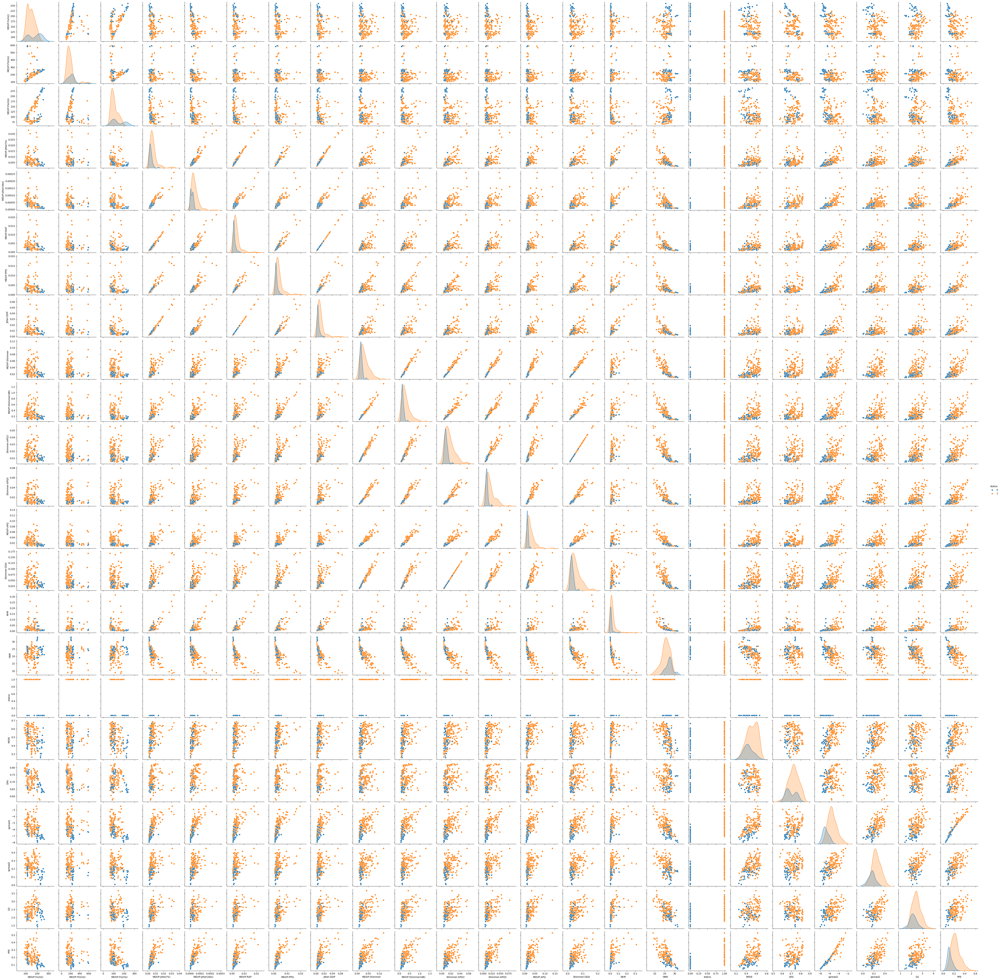

In [27]:
sns.pairplot(df, hue='status', vars=['MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Jitter(%)',
       'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ', 'Jitter:DDP',
       'MDVP:Shimmer', 'MDVP:Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'MDVP:APQ', 'Shimmer:DDA', 'NHR', 'HNR', 'status', 'RPDE', 'DFA',
       'spread1', 'spread2', 'D2', 'PPE'])

<Axes: xlabel='name', ylabel='count'>

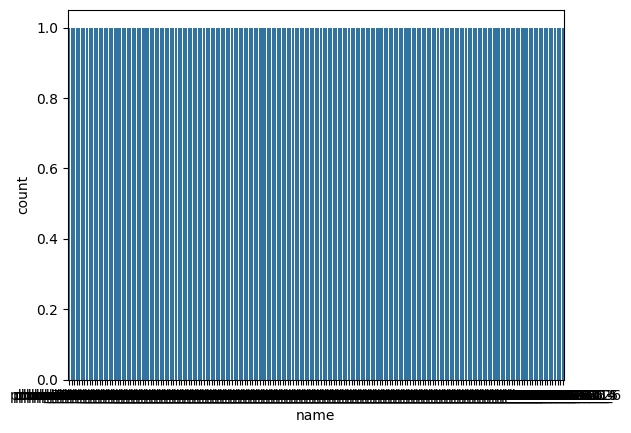

In [28]:
sns.countplot(df['status'])

In [29]:
df['status'].value_counts()

,count
status,
1,147
0,48


<Axes: ylabel='name'>

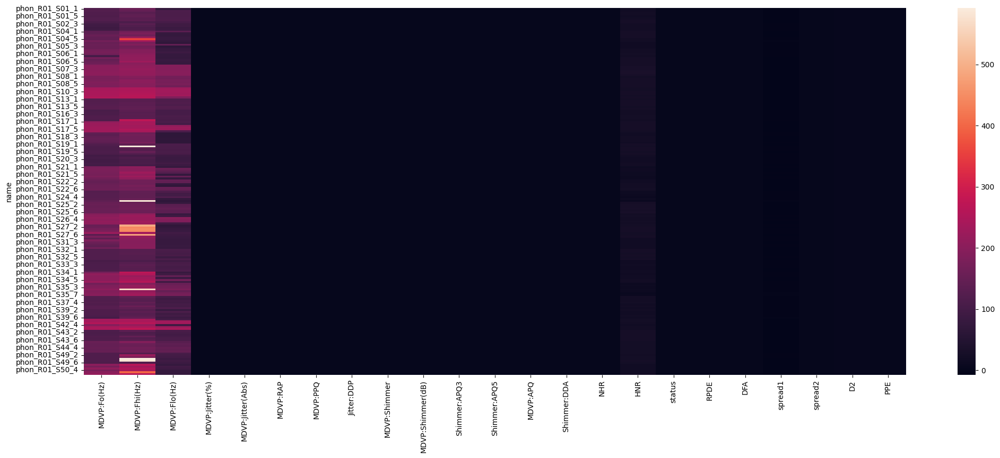

In [30]:
plt.figure(figsize=(25,9))
sns.heatmap(df)

<Axes: >

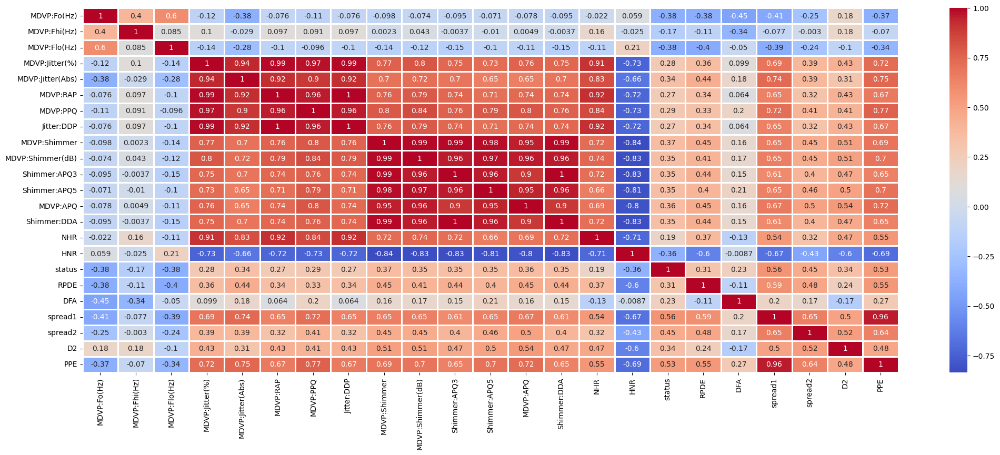

In [31]:
plt.figure(figsize=(25, 9))
sns.heatmap(df.corr(),cmap="coolwarm", annot=True, linewidths=2)

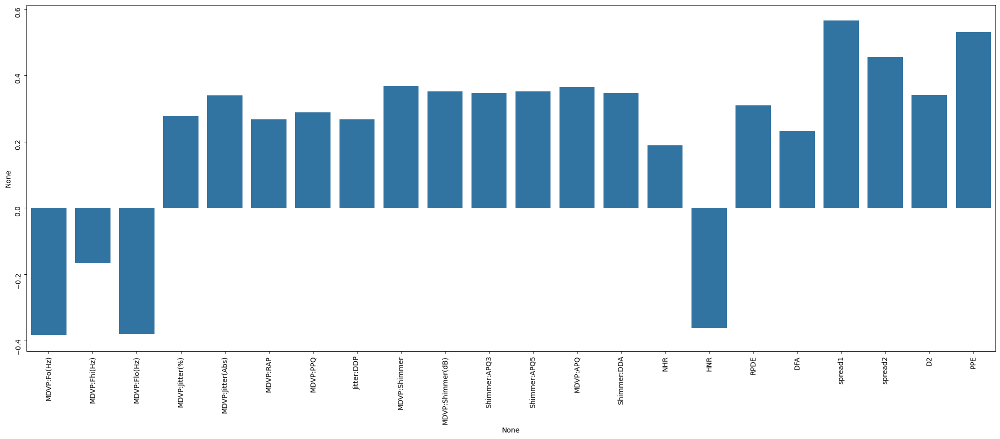

In [32]:
plt.figure(figsize = (25,9))
ax = sns.barplot(x=df.drop(columns=['status'], axis=1).corrwith(df.status).index, y=df.drop(columns=['status'], axis=1).corrwith(df.status))
ax.tick_params(labelrotation = 90)

2.3. Remove prefectly correlated features

In [33]:
df_trimmed = df.drop(columns=['MDVP:RAP', 'Shimmer:DDA'])
df_trimmed.shape

(195, 21)

<Axes: >

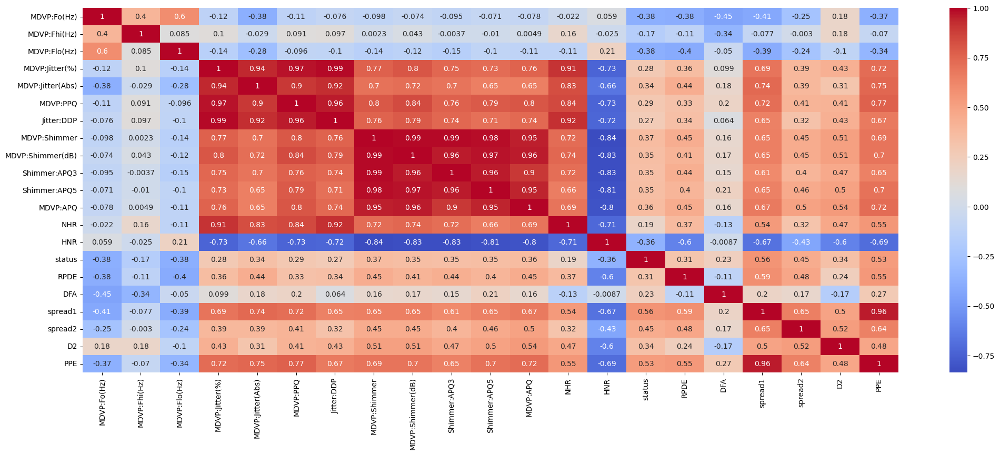

In [34]:
plt.figure(figsize=(25, 9))
sns.heatmap(df_trimmed.corr(),cmap="coolwarm", annot=True)

2.4. Remove outlairs

In [35]:
def diagnostic_plots(inp_df, variable):
    # function takes a dataframe (inp_df) and
    # the variable of interest as arguments

    print("******* {} *******".format(variable))

    # define figure size
    plt.figure(figsize=(8, 2))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(inp_df[variable], bins=30)
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(inp_df[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=inp_df[variable])
    plt.title('Boxplot')

    plt.show()

******* MDVP:Fo(Hz) *******


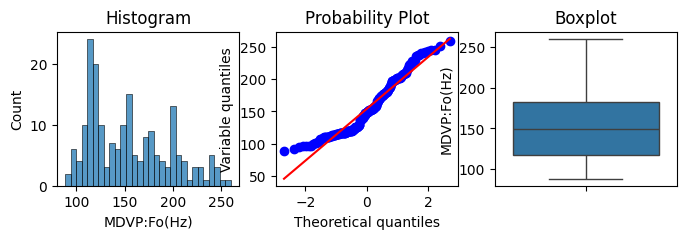

******* MDVP:Fhi(Hz) *******


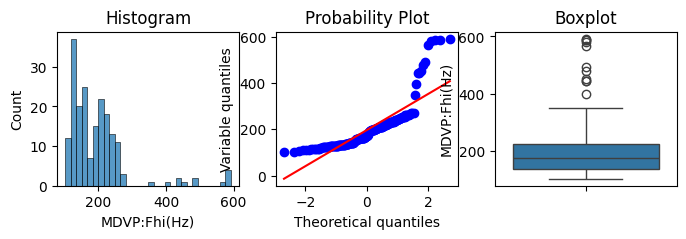

******* MDVP:Flo(Hz) *******


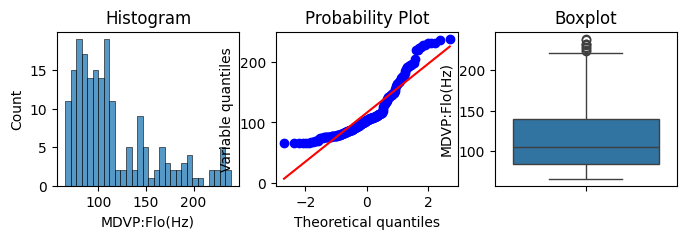

******* MDVP:Jitter(%) *******


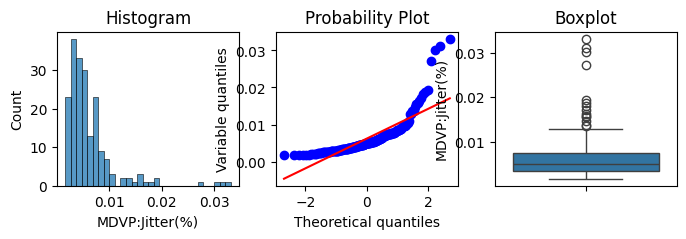

******* MDVP:Jitter(Abs) *******


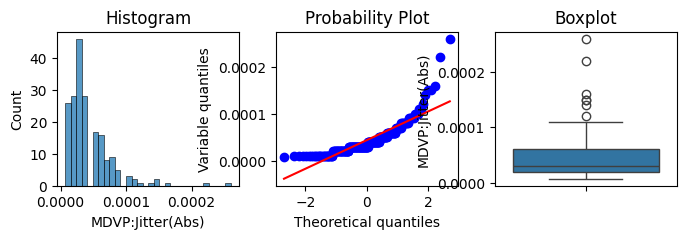

******* MDVP:RAP *******


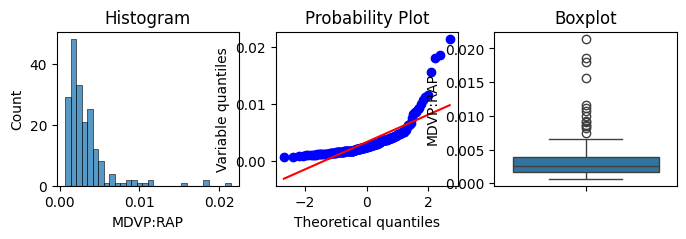

******* MDVP:PPQ *******


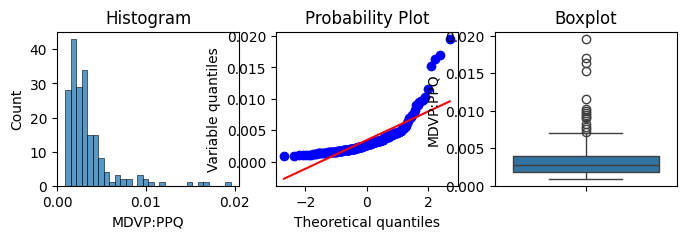

******* Jitter:DDP *******


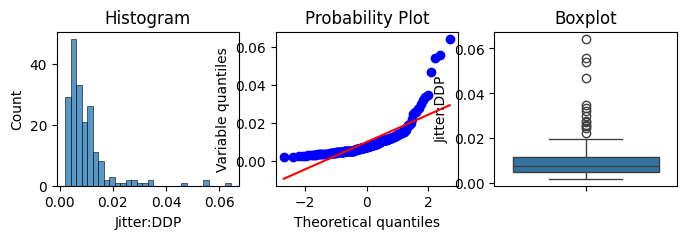

******* MDVP:Shimmer *******


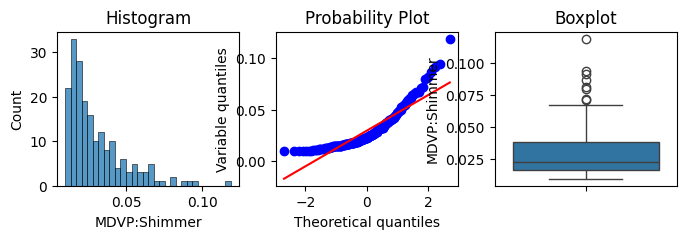

******* MDVP:Shimmer(dB) *******


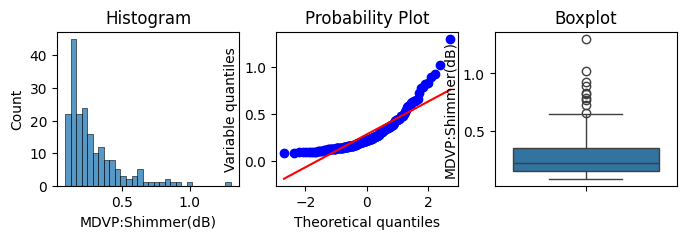

******* Shimmer:APQ3 *******


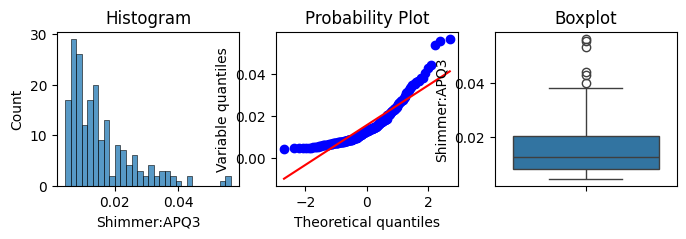

******* Shimmer:APQ5 *******


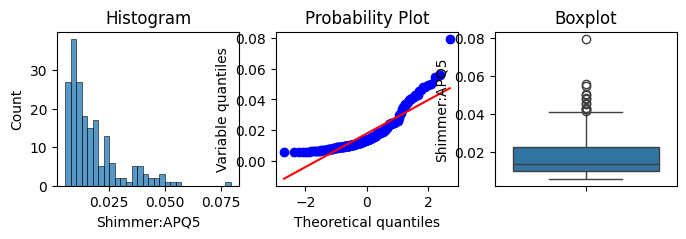

******* MDVP:APQ *******


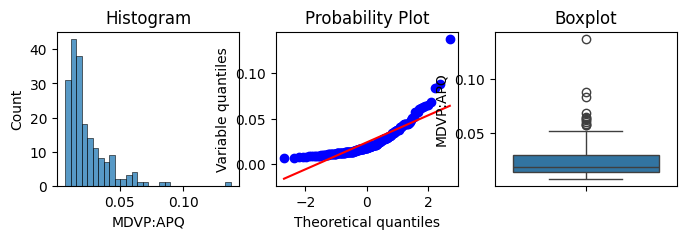

******* Shimmer:DDA *******


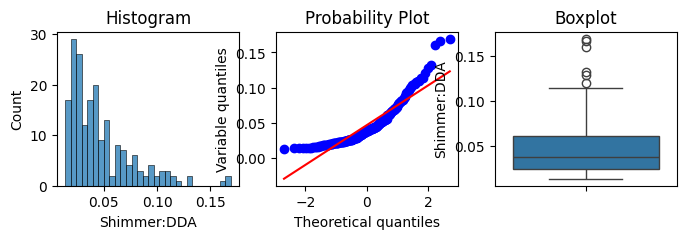

******* NHR *******


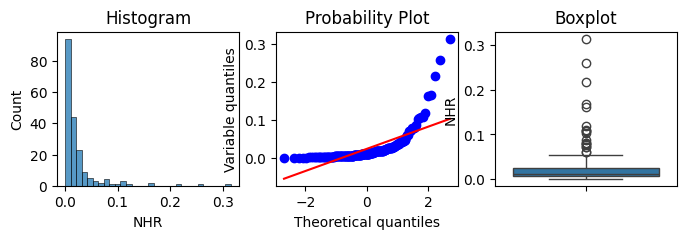

******* HNR *******


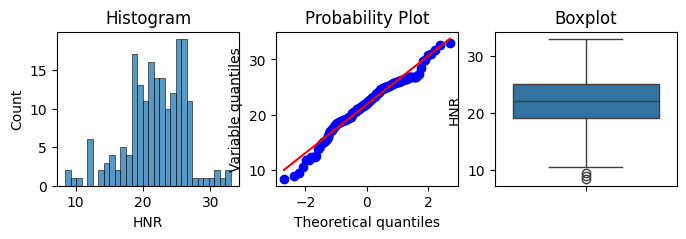

******* status *******


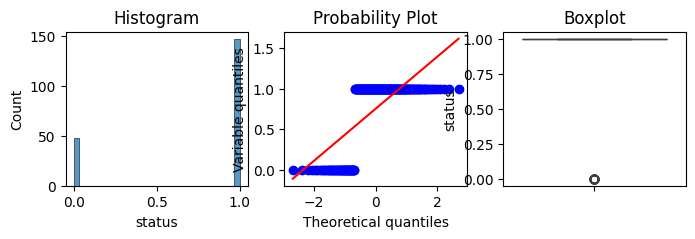

******* RPDE *******


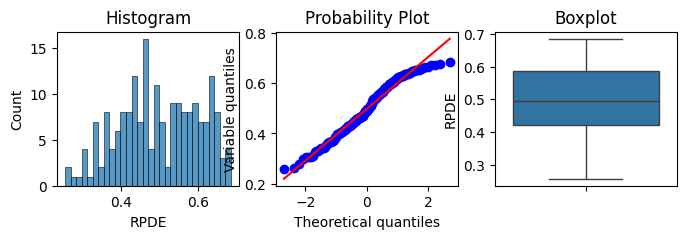

******* DFA *******


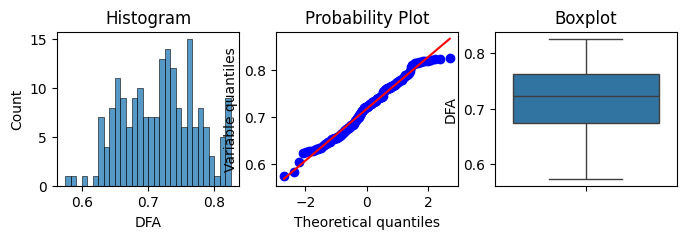

******* spread1 *******


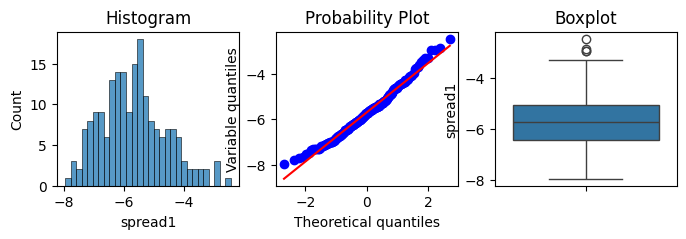

******* spread2 *******


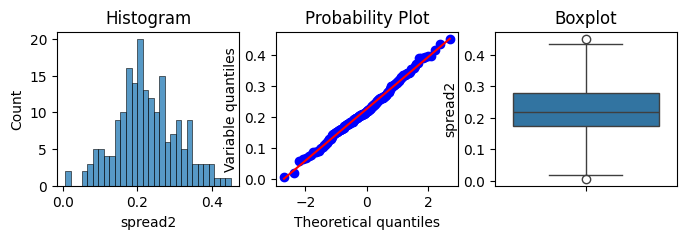

******* D2 *******


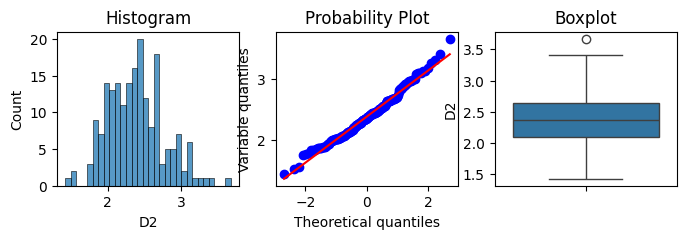

******* PPE *******


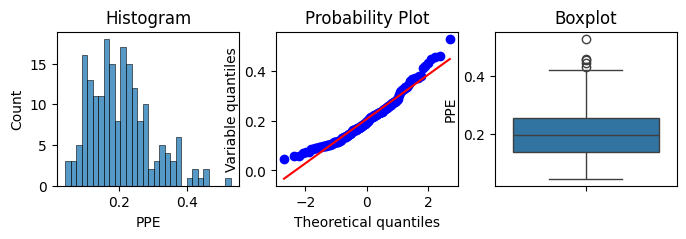

In [36]:
for var in df.columns:
  diagnostic_plots(df, var)

In [37]:
df_manual_outlair_removal = df.copy()

for col in df_manual_outlair_removal.columns:
  if col != 'status':
    Q1 = df_manual_outlair_removal[col].quantile(0.25)
    Q3 = df_manual_outlair_removal[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_manual_outlair_removal = df_manual_outlair_removal[(df_manual_outlair_removal[col] >= lower_bound) & (df_manual_outlair_removal[col] <= upper_bound)]

df_manual_outlair_removal.shape

(125, 23)

In [44]:
df_manual_outlair_removal.describe()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
count,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,...,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000
mean,150.288360,173.507056,117.054544,0.004586,0.000034,0.002344,0.002537,0.007033,0.022346,0.205752,...,0.035449,0.010771,23.459272,0.736000,0.477734,0.726756,-6.023949,0.205625,2.254890,0.180378
std,39.652001,46.932688,38.943109,0.001843,0.000018,0.001080,0.001072,0.003239,0.009302,0.088642,...,0.016035,0.007763,3.434114,0.442573,0.102275,0.050644,0.787076,0.066246,0.311146,0.063795
min,91.904000,102.145000,65.476000,0.001680,0.000007,0.000680,0.000920,0.002040,0.009540,0.085000,...,0.013640,0.000650,15.924000,0.000000,0.263654,0.574282,-7.964984,0.056844,1.423287,0.044539
25%,116.388000,131.067000,87.638000,0.003160,0.000020,0.001540,0.001750,0.004620,0.015030,0.136000,...,0.022610,0.004810,21.020000,0.000000,0.397937,0.691483,-6.547148,0.170183,2.021591,0.133050
50%,145.174000,163.417000,105.667000,0.004280,0.000030,0.002040,0.002210,0.006120,0.020180,0.189000,...,0.032180,0.008520,23.370000,1.000000,0.469928,0.730387,-5.966779,0.205660,2.264226,0.177807
75%,180.198000,208.900000,138.990000,0.005640,0.000040,0.003020,0.003290,0.009050,0.027910,0.257000,...,0.044500,0.016100,25.856000,1.000000,0.558586,0.763242,-5.456811,0.249172,2.470746,0.222716
max,252.455000,349.259000,225.227000,0.009230,0.000080,0.005070,0.005390,0.015200,0.049320,0.441000,...,0.080500,0.031910,33.047000,1.000000,0.685151,0.821364,-4.333543,0.363566,3.098256,0.344834


In [39]:
df_trimmed_manual_outlair_removal = df_trimmed.copy()

for col in df_trimmed_manual_outlair_removal.columns:
  if col != 'status':
    Q1 = df_trimmed_manual_outlair_removal[col].quantile(0.25)
    Q3 = df_trimmed_manual_outlair_removal[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_trimmed_manual_outlair_removal = df_trimmed_manual_outlair_removal[(df_trimmed_manual_outlair_removal[col] >= lower_bound) & (df_trimmed_manual_outlair_removal[col] <= upper_bound)]

df_trimmed_manual_outlair_removal.shape

(127, 21)

In [40]:
df_trimmed_manual_outlair_removal.describe()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),Shimmer:APQ3,...,MDVP:APQ,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
count,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,...,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000
mean,149.988559,173.380008,116.496937,0.004667,0.000034,0.002570,0.007188,0.022611,0.208409,0.011965,...,0.018104,0.011167,23.405614,0.740157,0.479489,0.726025,-6.010014,0.206363,2.262960,0.181417
std,39.413202,46.590838,38.937019,0.001938,0.000018,0.001096,0.003443,0.009558,0.091458,0.005488,...,0.007532,0.008324,3.438340,0.440285,0.102574,0.051013,0.788647,0.066070,0.315635,0.063823
min,91.904000,102.145000,65.476000,0.001680,0.000007,0.000920,0.002040,0.009540,0.085000,0.004550,...,0.007190,0.000650,15.924000,0.000000,0.263654,0.574282,-7.964984,0.056844,1.423287,0.044539
25%,116.618000,131.368000,87.593500,0.003185,0.000020,0.001755,0.004640,0.015095,0.136500,0.007615,...,0.012595,0.004825,20.893500,0.000000,0.398218,0.689188,-6.542867,0.171227,2.024409,0.133459
50%,144.188000,163.417000,105.554000,0.004310,0.000030,0.002310,0.006160,0.020330,0.189000,0.011070,...,0.016660,0.008710,23.239000,1.000000,0.470478,0.730387,-5.963040,0.206768,2.264501,0.179677
75%,179.210000,208.800500,137.015500,0.005850,0.000045,0.003320,0.009485,0.028450,0.263000,0.014920,...,0.022020,0.017260,25.838000,1.000000,0.562255,0.763100,-5.442590,0.249333,2.475160,0.226201
max,252.455000,349.259000,225.227000,0.009750,0.000080,0.005390,0.017780,0.049780,0.483000,0.027490,...,0.041140,0.038280,33.047000,1.000000,0.685151,0.821364,-4.333543,0.363566,3.098256,0.344834


# 3. Splitting test-train data & Feature Scaling, and then Model training

3.1. Extracting target column

In [47]:
X = df.drop(columns=['status'], axis=1)
y = df['status']

In [45]:
X_manual_outlair_removal = df_manual_outlair_removal.drop(columns=['status'], axis=1)
y_manual_outlair_removal = df_manual_outlair_removal['status']

In [42]:
X_trimmed = df_trimmed.drop(columns=['status'], axis=1)
y_trimmed = df_trimmed['status']

In [46]:
X_trimmed_manual_outlair_removal = df_trimmed_manual_outlair_removal.drop(columns=['status'], axis=1)
y_trimmed_manual_outlair_removal = df_trimmed_manual_outlair_removal['status']

3.2. importing required libraries

In [76]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

3.3. utility function to compare different scenario

In [80]:
def model_train_test(model,
                     labels=['df', 'df_manual_outlair_removal', 'df_trimmed', 'df_trimmed_manual_outlair_removal'],
                     x_list=[X, X_manual_outlair_removal, X_trimmed, X_trimmed_manual_outlair_removal],
                     y_list=[y, y_manual_outlair_removal, y_trimmed, y_trimmed_manual_outlair_removal]):
  for i in range(len(labels)):
    print("X shape = ", x_list[i].shape)
    print("y shape = ", y_list[i].shape)

    # spliting train-test data
    X_train, X_test, y_train, y_test = train_test_split(x_list[i], y_list[i], test_size = 0.5, random_state = 51)

    model_normal = model
    model_normal.fit(X_train, y_train)
    y_pred_normal = model_normal.predict(X_test)

    # standard scaling
    standard_scaler = StandardScaler()
    standard_scaler.fit(X_train)
    X_train_sc = standard_scaler.transform(X_train)
    X_test_sc = standard_scaler.transform(X_test)

    model_sc = model
    model_sc.fit(X_train_sc, y_train)
    y_pred_sc = model_sc.predict(X_test_sc)

    print("%s (normal) : train_accuracy = %.8f, test_accuracy = %.8f"%(labels[i], model_normal.score(X_train, y_train), accuracy_score(y_test, y_pred_normal)))
    print("%s (standard scaled) : train_accuracy = %.8f, test_accuracy = %.8f"%(labels[i], model_sc.score(X_train_sc, y_train), accuracy_score(y_test, y_pred_sc)))

    if labels[i]=='df' or labels[i]=='df_trimmed':
      # robust scaling
      robust_scaler = RobustScaler()
      robust_scaler.fit(X_train)
      X_train_rc = robust_scaler.transform(X_train)
      X_test_rc = robust_scaler.transform(X_test)

      model_rc = model
      model_rc.fit(X_train_rc, y_train)
      y_pred_rc = model_rc.predict(X_test_rc)

      print("%s (robust scaled) : train_accuracy = %.8f, test_accuracy = %.8f"%(labels[i], model_rc.score(X_train_rc, y_train), accuracy_score(y_test, y_pred_rc)))

    print("--------------------------------------------------------------------------------------------------------------------------")


3.4. Logistic Regression

In [81]:
from sklearn.linear_model import LogisticRegression
lr_classifier = LogisticRegression(random_state = 51, penalty = 'l2')
model_train_test(lr_classifier)

X shape =  (195, 22)
y shape =  (195,)
df (normal) : train_accuracy = 0.22680412, test_accuracy = 0.88775510
df (standard scaled) : train_accuracy = 0.88659794, test_accuracy = 0.81632653
df (robust scaled) : train_accuracy = 0.87628866, test_accuracy = 0.84693878
--------------------------------------------------------------------------------------------------------------------------
X shape =  (125, 22)
y shape =  (125,)
df_manual_outlair_removal (normal) : train_accuracy = 0.24193548, test_accuracy = 0.74603175
df_manual_outlair_removal (standard scaled) : train_accuracy = 0.90322581, test_accuracy = 0.74603175
--------------------------------------------------------------------------------------------------------------------------
X shape =  (195, 20)
y shape =  (195,)
df_trimmed (normal) : train_accuracy = 0.22680412, test_accuracy = 0.87755102
df_trimmed (standard scaled) : train_accuracy = 0.89690722, test_accuracy = 0.80612245
df_trimmed (robust scaled) : train_accuracy = 0.876

3.5. Support vector machine

In [82]:
from sklearn.svm import SVC
svc_classifier = SVC()
model_train_test(svc_classifier)

X shape =  (195, 22)
y shape =  (195,)
df (normal) : train_accuracy = 0.77319588, test_accuracy = 0.73469388
df (standard scaled) : train_accuracy = 0.87628866, test_accuracy = 0.89795918
df (robust scaled) : train_accuracy = 0.86597938, test_accuracy = 0.87755102
--------------------------------------------------------------------------------------------------------------------------
X shape =  (125, 22)
y shape =  (125,)
df_manual_outlair_removal (normal) : train_accuracy = 0.75806452, test_accuracy = 0.71428571
df_manual_outlair_removal (standard scaled) : train_accuracy = 0.90322581, test_accuracy = 0.76190476
--------------------------------------------------------------------------------------------------------------------------
X shape =  (195, 20)
y shape =  (195,)
df_trimmed (normal) : train_accuracy = 0.77319588, test_accuracy = 0.73469388
df_trimmed (standard scaled) : train_accuracy = 0.88659794, test_accuracy = 0.90816327
df_trimmed (robust scaled) : train_accuracy = 0.865

3.6. K – Nearest Neighbor Classifier

In [70]:
from sklearn.neighbors import KNeighborsClassifier
knn_classifier = KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2)
model_train_test(knn_classifier)

X shape =  (195, 22)
y shape =  (195,)
df (normal) : train_accuracy = 0.26804124, test_accuracy = 0.77551020
df (standard scaled) : train_accuracy = 0.93814433, test_accuracy = 0.86734694
df (robust scaled) : train_accuracy = 0.91752577, test_accuracy = 0.92857143
--------------------------------------------------------------------------------------------------------------------------
X shape =  (125, 22)
y shape =  (125,)
df_manual_outlair_removal (normal) : train_accuracy = 0.24193548, test_accuracy = 0.76190476
df_manual_outlair_removal (standard scaled) : train_accuracy = 0.91935484, test_accuracy = 0.79365079
--------------------------------------------------------------------------------------------------------------------------
X shape =  (195, 20)
y shape =  (195,)
df_trimmed (normal) : train_accuracy = 0.26804124, test_accuracy = 0.77551020
df_trimmed (standard scaled) : train_accuracy = 0.94845361, test_accuracy = 0.87755102
df_trimmed (robust scaled) : train_accuracy = 0.907

3.7. Naive Bayes Classifier

In [71]:
from sklearn.naive_bayes import GaussianNB
nb_classifier = GaussianNB()
model_train_test(nb_classifier)

X shape =  (195, 22)
y shape =  (195,)
df (normal) : train_accuracy = 0.22680412, test_accuracy = 0.64285714
df (standard scaled) : train_accuracy = 0.64948454, test_accuracy = 0.63265306
df (robust scaled) : train_accuracy = 0.64948454, test_accuracy = 0.63265306
--------------------------------------------------------------------------------------------------------------------------
X shape =  (125, 22)
y shape =  (125,)
df_manual_outlair_removal (normal) : train_accuracy = 0.24193548, test_accuracy = 0.68253968
df_manual_outlair_removal (standard scaled) : train_accuracy = 0.62903226, test_accuracy = 0.66666667
--------------------------------------------------------------------------------------------------------------------------
X shape =  (195, 20)
y shape =  (195,)
df_trimmed (normal) : train_accuracy = 0.22680412, test_accuracy = 0.65306122
df_trimmed (standard scaled) : train_accuracy = 0.65979381, test_accuracy = 0.66326531
df_trimmed (robust scaled) : train_accuracy = 0.659

3.8. Decision Tree Classifier

In [84]:
from sklearn.tree import DecisionTreeClassifier
dt_classifier = DecisionTreeClassifier(criterion = 'entropy', random_state = 51)
model_train_test(dt_classifier)

X shape =  (195, 22)
y shape =  (195,)
df (normal) : train_accuracy = 0.22680412, test_accuracy = 0.85714286
df (standard scaled) : train_accuracy = 1.00000000, test_accuracy = 0.85714286
df (robust scaled) : train_accuracy = 1.00000000, test_accuracy = 0.85714286
--------------------------------------------------------------------------------------------------------------------------
X shape =  (125, 22)
y shape =  (125,)
df_manual_outlair_removal (normal) : train_accuracy = 0.24193548, test_accuracy = 0.80952381
df_manual_outlair_removal (standard scaled) : train_accuracy = 1.00000000, test_accuracy = 0.80952381
--------------------------------------------------------------------------------------------------------------------------
X shape =  (195, 20)
y shape =  (195,)
df_trimmed (normal) : train_accuracy = 0.77319588, test_accuracy = 0.82653061
df_trimmed (standard scaled) : train_accuracy = 1.00000000, test_accuracy = 0.82653061
df_trimmed (robust scaled) : train_accuracy = 1.000

3.9. Random Forest Classifier

In [85]:
from sklearn.ensemble import RandomForestClassifier
rf_classifier = RandomForestClassifier(n_estimators = 20, criterion = 'entropy', random_state = 51)
model_train_test(rf_classifier)

X shape =  (195, 22)
y shape =  (195,)
df (normal) : train_accuracy = 0.77319588, test_accuracy = 0.88775510
df (standard scaled) : train_accuracy = 1.00000000, test_accuracy = 0.88775510
df (robust scaled) : train_accuracy = 1.00000000, test_accuracy = 0.88775510
--------------------------------------------------------------------------------------------------------------------------
X shape =  (125, 22)
y shape =  (125,)
df_manual_outlair_removal (normal) : train_accuracy = 0.75806452, test_accuracy = 0.84126984
df_manual_outlair_removal (standard scaled) : train_accuracy = 1.00000000, test_accuracy = 0.84126984
--------------------------------------------------------------------------------------------------------------------------
X shape =  (195, 20)
y shape =  (195,)
df_trimmed (normal) : train_accuracy = 0.77319588, test_accuracy = 0.90816327
df_trimmed (standard scaled) : train_accuracy = 1.00000000, test_accuracy = 0.90816327
df_trimmed (robust scaled) : train_accuracy = 1.000

3.10. Adaboost Classifier

In [86]:
from sklearn.ensemble import AdaBoostClassifier
adb_classifier = AdaBoostClassifier(DecisionTreeClassifier(criterion = 'entropy', random_state = 200),
                                    n_estimators=2000,
                                    learning_rate=0.1,
                                    algorithm='SAMME.R',
                                    random_state=1,)
model_train_test(adb_classifier)

X shape =  (195, 22)
y shape =  (195,)
df (normal) : train_accuracy = 0.22680412, test_accuracy = 0.85714286
df (standard scaled) : train_accuracy = 1.00000000, test_accuracy = 0.85714286
df (robust scaled) : train_accuracy = 1.00000000, test_accuracy = 0.85714286
--------------------------------------------------------------------------------------------------------------------------
X shape =  (125, 22)
y shape =  (125,)
df_manual_outlair_removal (normal) : train_accuracy = 0.24193548, test_accuracy = 0.80952381
df_manual_outlair_removal (standard scaled) : train_accuracy = 1.00000000, test_accuracy = 0.80952381
--------------------------------------------------------------------------------------------------------------------------
X shape =  (195, 20)
y shape =  (195,)
df_trimmed (normal) : train_accuracy = 0.22680412, test_accuracy = 0.86734694
df_trimmed (standard scaled) : train_accuracy = 1.00000000, test_accuracy = 0.86734694
df_trimmed (robust scaled) : train_accuracy = 1.000

3.11. XGBoost Classifier

In [87]:
from xgboost import XGBClassifier
xgb_classifier = XGBClassifier()
model_train_test(xgb_classifier)

X shape =  (195, 22)
y shape =  (195,)
df (normal) : train_accuracy = 0.77319588, test_accuracy = 0.91836735
df (standard scaled) : train_accuracy = 1.00000000, test_accuracy = 0.91836735
df (robust scaled) : train_accuracy = 1.00000000, test_accuracy = 0.91836735
--------------------------------------------------------------------------------------------------------------------------
X shape =  (125, 22)
y shape =  (125,)
df_manual_outlair_removal (normal) : train_accuracy = 0.75806452, test_accuracy = 0.87301587
df_manual_outlair_removal (standard scaled) : train_accuracy = 1.00000000, test_accuracy = 0.87301587
--------------------------------------------------------------------------------------------------------------------------
X shape =  (195, 20)
y shape =  (195,)
df_trimmed (normal) : train_accuracy = 0.77319588, test_accuracy = 0.91836735
df_trimmed (standard scaled) : train_accuracy = 1.00000000, test_accuracy = 0.91836735
df_trimmed (robust scaled) : train_accuracy = 1.000

# 4. Parameter tuning

we will tune K – Nearest Neighbor Classifier and XGBoost Classifier. we will also try to see if they generalize well.

4.1. XGBoost classifier

In [89]:
# XGBoost classifier most required parameters
xgb_params={
 "learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
 "min_child_weight" : [ 1, 3, 5, 7 ],
 "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
 "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ]
}

In [125]:
X_train, X_test, y_train, y_test = train_test_split(X_trimmed, y_trimmed, test_size = 0.5, random_state = 51)

In [126]:
robust_scaler = RobustScaler()
robust_scaler.fit(X_train)
X_train_rc = robust_scaler.transform(X_train)
X_test_rc = robust_scaler.transform(X_test)

In [127]:
# Randomized Search
from sklearn.model_selection import RandomizedSearchCV
random_search = RandomizedSearchCV(xgb_classifier, param_distributions=xgb_params, scoring= 'roc_auc', n_jobs= -1, verbose= 3)
random_search.fit(X_train_rc, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate=None...
                                           monotone_constraints=None,
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=None, ...),
                   n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.3, 0.4, 0.5,
                                                             0.7],
                                        'gamma': [0.0, 0.1, 0.2, 0.3, 0.4],
                                        'learning_rate': [0.05, 0.1, 0.15, 0.2,
                                                          0.25, 0.3],
                                        'max_depth': [3, 4, 5, 6, 8, 10, 12,
                                                      15],
                                        'min_child_weight': [1, 3, 5, 7]},
                   scoring='roc_auc', verbose=3)

In [128]:
random_search.best_params_

{'min_child_weight': 1,
 'max_depth': 15,
 'learning_rate': 0.15,
 'gamma': 0.4,
 'colsample_bytree': 0.4}

In [129]:
random_search.best_estimator_

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.4, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.4, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.15, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=15, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [130]:
random_search.best_score_

0.9440000000000002

In [150]:
# tuned xgboost classifier
xgb_classifier_pt = XGBClassifier(min_child_weight=1, max_depth=15, learning_rate=0.15, gamma=0.4, colsample_bytree=0.4)

In [162]:
xgb_classifier_pt.fit(X_train_rc, y_train)
y_pred_xgb_pt = xgb_classifier_pt.predict(X_test_rc)

In [163]:
accuracy_score(y_test, y_pred_xgb_pt)

0.9081632653061225

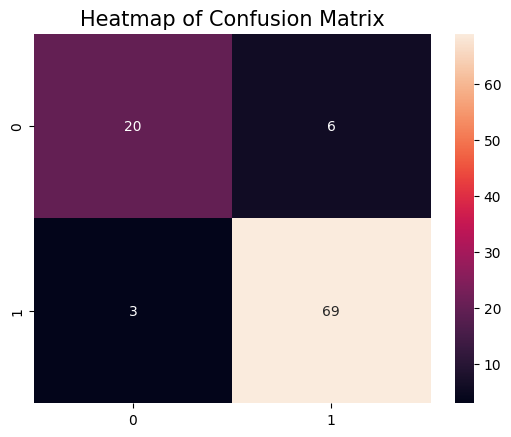

In [164]:
cm = confusion_matrix(y_test, y_pred_xgb_pt)
plt.title('Heatmap of Confusion Matrix', fontsize = 15)
sns.heatmap(cm, annot = True)
plt.show()

In [154]:
print(classification_report(y_test, y_pred_xgb_pt))

              precision    recall  f1-score   support

           0       0.87      0.77      0.82        26
           1       0.92      0.96      0.94        72

    accuracy                           0.91        98
   macro avg       0.89      0.86      0.88        98
weighted avg       0.91      0.91      0.91        98



4.1.1. cross validation for xgboost classifier

In [155]:
from sklearn.model_selection import cross_val_score
cross_validation = cross_val_score(estimator = xgb_classifier_pt, X = X_train_rc,y = y_train, cv = 10)
print("Cross validation accuracy of XGBoost model = ", cross_validation)
print("\nCross validation mean accuracy of XGBoost model = ", cross_validation.mean())

Cross validation accuracy of XGBoost model =  [0.7        1.         0.9        0.9        1.         0.9
 0.7        0.88888889 0.88888889 1.        ]

Cross validation mean accuracy of XGBoost model =  0.8877777777777778


The mean accuracy value of cross-validation is 88.78% and XGBoost model accuracy is 90.82%. It showing XGBoost is slightly overfitted but as training data will grow, the model will generalize.

4.2. K – Nearest Neighbor Classifier

In [140]:
knn_params = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}


In [141]:
X_train, X_test, y_train, y_test = train_test_split(X_trimmed, y_trimmed, test_size = 0.5, random_state = 51)

In [142]:
robust_scaler = RobustScaler()
robust_scaler.fit(X_train)
X_train_rc = robust_scaler.transform(X_train)
X_test_rc = robust_scaler.transform(X_test)

In [143]:
random_search = RandomizedSearchCV(knn_classifier, param_distributions=knn_params, scoring= 'roc_auc', n_jobs= -1, verbose= 3)
random_search.fit(X_train_rc, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(estimator=KNeighborsClassifier(), n_jobs=-1,
                   param_distributions={'metric': ['euclidean', 'manhattan',
                                                   'minkowski'],
                                        'n_neighbors': [3, 5, 7, 9, 11],
                                        'weights': ['uniform', 'distance']},
                   scoring='roc_auc', verbose=3)

In [144]:
random_search.best_params_

{'weights': 'distance', 'n_neighbors': 9, 'metric': 'manhattan'}

In [145]:
random_search.best_estimator_

KNeighborsClassifier(metric='manhattan', n_neighbors=9, weights='distance')

In [146]:
random_search.best_score_

0.9546666666666667

In [156]:
# tuned knn classifier
knn_classifier_pt = KNeighborsClassifier(metric='manhattan', n_neighbors=9, weights='distance')

In [159]:
knn_classifier_pt.fit(X_train_rc, y_train)
y_pred_knn_pt = knn_classifier_pt.predict(X_test_rc)

In [160]:
accuracy_score(y_test, y_pred_knn_pt)

0.8775510204081632

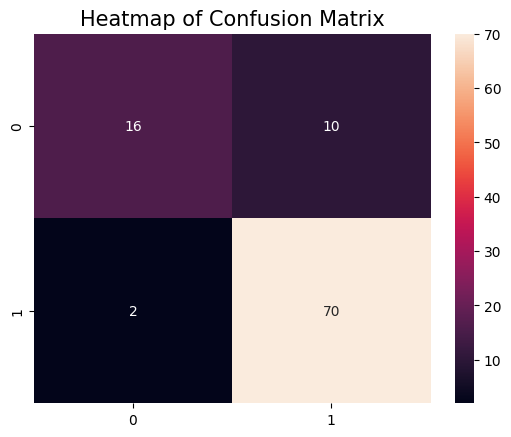

In [161]:
cm = confusion_matrix(y_test, y_pred_knn_pt)
plt.title('Heatmap of Confusion Matrix', fontsize = 15)
sns.heatmap(cm, annot = True)
plt.show()

In [165]:
print(classification_report(y_test, y_pred_knn_pt))

              precision    recall  f1-score   support

           0       0.89      0.62      0.73        26
           1       0.88      0.97      0.92        72

    accuracy                           0.88        98
   macro avg       0.88      0.79      0.82        98
weighted avg       0.88      0.88      0.87        98



4.2.1. cross validation for knn classifier

In [166]:
cross_validation = cross_val_score(estimator = knn_classifier_pt, X = X_train_rc,y = y_train, cv = 10)
print("Cross validation accuracy of KNN model = ", cross_validation)
print("\nCross validation mean accuracy of KNN model = ", cross_validation.mean())

Cross validation accuracy of KNN model =  [0.9        0.9        1.         0.9        0.9        0.9
 0.7        0.88888889 0.88888889 0.88888889]

Cross validation mean accuracy of KNN model =  0.8866666666666667


The mean accuracy value of cross-validation is 88.67% and KNN model accuracy is 87.75%. It showing KNN has generalized well.

Although, XGBoost gives better accuracy, KNN has lower false negative. Moreover KNN has generalized well. Hence, currently we would perfer KNN model.